# <mark>BirdCLEF 2024 - EDA</mark>
<span style="font-size:22px;color:purple"> Thank you for having a look at my notebook - advice and feedback always welcomed!</span>


<div class="alert alert-block alert-info" style="font-size:14px; font-family:verdana;">
    📌 Dataset Link: <a href="https://www.kaggle.com/competitions/birdclef-2024/data">https://www.kaggle.com/competitions/birdclef-2024/data</a>
</div>


## **Exploratory Data Analysis (EDA)** 
EDA is a crucial step in understanding and preparing your data for any data analysis or machine learning project. Here's a step-by-step guide on how to perform an EDA for this dataset:

**Overview**

In this competition, you will be predicting default of clients based on internal and external information that are available for each client. Scoring is performed using custom metric that not only evaluates the AUC of predictions but also considers the stability of predictions model across the data range of the test set. To better understand this metric.


**Data Collection:**

This dataset contains a large number of tables as a result of utilizing diverse data sources and the varying levels of data aggregation used while preparing the dataset. Note: All files listed below are found in both .csv and .parquet formats.


**Data Loading:**

Import the dataset into your preferred data analysis environment, such as Python with libraries like pandas, numpy, and matplotlib/seaborn for visualization.



### **Initial Exploration:**

**1 - Start by examining the basic characteristics of the data:**

    Check the first few rows using df.head().
    Check the data types and missing values using df.info().
    Calculate basic statistics using df.describe().
    Data Cleaning:

**2 - Handle missing values, outliers, and duplicates:**

    Use techniques like imputation for missing values.
    Identify and deal with outliers appropriately.
    Remove duplicate rows if necessary.
    
**3 - Data Visualization:**

    Create visualizations to gain insights into the data:
    Histograms and box plots for numerical features.
    Bar plots for categorical features.
    Correlation matrix and scatter plots to understand relationships between variables.
    
**4 - Feature Analysis:**

    Explore relationships between features and the target variable(s) for classification and outlier detection.
    Visualize how different features vary across different subtypes or classes.
    Use box plots, violin plots, or swarm plots to compare feature distributions.

**5 - Outlier Detection:**

    If your dataset contains information related to outlier detection, perform a dedicated EDA for this aspect:
    Visualize outliers using scatter plots or box plots.
    Apply statistical methods or machine learning techniques to identify outliers.

**6 - Dimensionality Reduction (optional):**

    If the dataset has many features, consider dimensionality reduction techniques like Principal Component Analysis (PCA) to reduce the number of variables while preserving important information.

**8 - Summary and Insights:**

    Summarize your findings from the EDA, including any patterns, trends, or anomalies observed.
    Document any data preprocessing steps applied.

**7 - Next Steps:**

    Based on your EDA findings, plan your next steps, which may include feature engineering, model selection, and further data preprocessing.


Remember that EDA is an iterative process, and you may need to revisit these steps as you delve deeper into the dataset and develop your machine learning or data analysis models.


## **Dataset Description**
Your challenge in this competition is to identify which birds are calling in recordings made in a Global Biodiversity Hotspot in the Western Ghats. This is an important task for scientists who monitor bird populations for conservation purposes. More accurate solutions could enable more comprehensive monitoring.

This competition uses a hidden test set. When your submitted notebook is scored, the actual test data will be made available to your notebook.

## **Files**
**train_audio/** The training data consists of short recordings of individual bird calls generously uploaded by users of xenocanto.org. These files have been downsampled to 32 kHz where applicable to match the test set audio and converted to the ogg format. The training data should have nearly all relevant files; we expect there is no benefit to looking for more on xenocanto.org and appreciate your cooperation in limiting the burden on their servers.

**test_soundscapes/** When you submit a notebook, the test_soundscapes directory will be populated with approximately 1,100 recordings to be used for scoring. They are 4 minutes long and in ogg audio format. The file names are randomized. It should take your submission notebook approximately five minutes to load all of the test soundscapes.

**unlabeled_soundscapes/** Unlabeled audio data from the same recording locations as the test soundscapes.

**train_metadata.csv** A wide range of metadata is provided for the training data. The most directly relevant fields are:

**primary_label** - a code for the bird species. You can review detailed information about the bird codes by appending the code to https://ebird.org/species/, such as https://ebird.org/species/amecro for the American Crow.

**latitude & longitude:** coordinates for where the recording was taken. Some bird species may have local call 'dialects,' so you may want to seek geographic diversity in your training data.

**author** - The user who provided the recording.

**filename:** the name of the associated audio file.

**sample_submission.csv** A valid sample submission.

row_id: A slug of [soundscape_id]_[end_time] for the prediction.
[bird_id]: There are 182 bird ID columns. You will need to predict the probability of the presence of each bird for each row.
eBird_Taxonomy_v2021.csv - Data on the relationships between different species.

In [1]:
!pip install nbformat

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

import pandas as pd
pd.options.mode.chained_assignment = None # avoids assignment warning
import numpy as np
import random
from glob import glob
from tqdm import tqdm
tqdm.pandas()  # enable progress bars in pandas operations
import gc

import librosa
import sklearn
import json

# Import for visualization
import matplotlib as mpl
#cmap = mpl.cm.get_cmap('coolwarm')
import matplotlib.pyplot as plt
import librosa.display as lid
import IPython.display as ipd
#import cv2

# Import KaggleDatasets for accessing Kaggle datasets
#from kaggle_datasets import KaggleDatasets

# WandB for experiment tracking
#import wandb

import torchaudio
import plotly.express as px
from IPython.display import Audio
from shapely.geometry import Point

import plotly.express as px

In [3]:
# Load the train_metadata.csv file
metadata_df = pd.read_csv('input/birdclef-2024/train_metadata.csv')

# Display the first few rows of the metadata dataframe
metadata_df.head()

,primary_label,secondary_labels,type,latitude,longitude,scientific_name,common_name,author,license,rating,url,filename
0,asbfly,[],['call'],39.2297,118.1987,Muscicapa dauurica,Asian Brown Flycatcher,Matt Slaymaker,Creative Commons Attribution-NonCommercial-Sha...,5.0,https://www.xeno-canto.org/134896,asbfly/XC134896.ogg
1,asbfly,[],['song'],51.4030,104.6401,Muscicapa dauurica,Asian Brown Flycatcher,Magnus Hellström,Creative Commons Attribution-NonCommercial-Sha...,2.5,https://www.xeno-canto.org/164848,asbfly/XC164848.ogg
2,asbfly,[],['song'],36.3319,127.3555,Muscicapa dauurica,Asian Brown Flycatcher,Stuart Fisher,Creative Commons Attribution-NonCommercial-Sha...,2.5,https://www.xeno-canto.org/175797,asbfly/XC175797.ogg
3,asbfly,[],['call'],21.1697,70.6005,Muscicapa dauurica,Asian Brown Flycatcher,vir joshi,Creative Commons Attribution-NonCommercial-Sha...,4.0,https://www.xeno-canto.org/207738,asbfly/XC207738.ogg
4,asbfly,[],['call'],15.5442,73.7733,Muscicapa dauurica,Asian Brown Flycatcher,Albert Lastukhin & Sergei Karpeev,Creative Commons Attribution-NonCommercial-Sha...,4.0,https://www.xeno-canto.org/209218,asbfly/XC209218.ogg


In [4]:
train_path = r'input\birdclef-2024\train_audio'
filename = metadata_df.filename[0].replace('/', '\\')  # Replace forward slashes with backslashes if necessary
file_path = os.path.join(train_path, filename)
data, rate = torchaudio.load(file_path)
display(Audio(data[0, :rate*5], rate=rate))
px.line(y=data[0, :rate*5], title=metadata_df.common_name[0])

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'hovertemplate': 'x=%{x}<br>y=%{y}<extra></extra>',
              'legendgroup': '',
              'line': {'color': '#636efa', 'dash': 'solid'},
              'marker': {'symbol': 'circle'},
              'mode': 'lines',
              'name': '',
              'showlegend': False,
              'type': 'scattergl',
              'x': array([     0,      1,      2, ..., 159997, 159998, 159999], dtype=int64),
              'xaxis': 'x',
              'y': array([ 1.3738348e-06,  9.2570752e-07, -2.7168753e-06, ...,  2.9183255e-05,
                           4.4586771e-04,  6.4230897e-04], dtype=float32),
              'yaxis': 'y'}],
    'layout': {'legend': {'tracegroupgap': 0},
               'template': '...',
               'title': {'text': 'Asian Brown Flycatcher'},
               'xaxis': {'anchor': 'y', 'domain': [0.0, 1.0], 'title': {'text': 'x'}},
               'yaxis': {'anchor': 'x', 'domain': [0.0, 1.0], 'title': {'text': 'y'}}}
})

In [5]:
# Assuming metadata_df contains the data
# Create scatter plot on a map
fig = px.scatter_mapbox(metadata_df, lat='latitude', lon='longitude', color='primary_label', 
                        hover_name='primary_label', hover_data=['latitude', 'longitude'], 
                        title='Geographical Distribution of Bird Species',
                        zoom=1, height=600)
fig.update_layout(mapbox_style="open-street-map")
fig.show()

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

In [ ]:
# Load the train_metadata.csv file
eBird_Taxonomy_df = pd.read_csv('input/birdclef-2024/eBird_Taxonomy_v2021.csv')

# Display the first few rows of the metadata dataframe
eBird_Taxonomy_df.head()

,TAXON_ORDER,CATEGORY,SPECIES_CODE,PRIMARY_COM_NAME,SCI_NAME,ORDER1,FAMILY,SPECIES_GROUP,REPORT_AS
0,1,species,ostric2,Common Ostrich,Struthio camelus,Struthioniformes,Struthionidae (Ostriches),Ostriches,NaN
1,6,species,ostric3,Somali Ostrich,Struthio molybdophanes,Struthioniformes,Struthionidae (Ostriches),NaN,NaN
2,7,slash,y00934,Common/Somali Ostrich,Struthio camelus/molybdophanes,Struthioniformes,Struthionidae (Ostriches),NaN,NaN
3,8,species,grerhe1,Greater Rhea,Rhea americana,Rheiformes,Rheidae (Rheas),Rheas,NaN
4,14,species,lesrhe2,Lesser Rhea,Rhea pennata,Rheiformes,Rheidae (Rheas),NaN,NaN


In [ ]:
# Summary statistics
metadata_df.describe()

,latitude,longitude,rating
count,24081.000000,24081.000000,24459.000000
mean,32.537040,43.640699,3.843493
std,19.440382,50.191352,1.100840
min,-43.524000,-171.765400,0.000000
25%,17.160100,2.545700,3.000000
50%,37.155100,26.687600,4.000000
75%,49.114400,85.319300,5.000000
max,71.964000,177.447800,5.000000


In [ ]:
# Check for missing values
metadata_df.isnull().sum()

primary_label         0
secondary_labels      0
type                  0
latitude            378
longitude           378
scientific_name       0
common_name           0
author                0
license               0
rating                0
url                   0
filename              0
dtype: int64

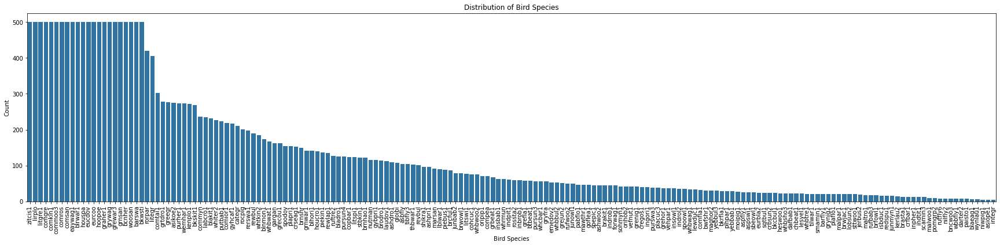

In [ ]:
# Distribution of bird species in the training data
plt.figure(figsize=(30, 6))
sns.countplot(x='primary_label', data=metadata_df, order=metadata_df['primary_label'].value_counts().index)
plt.xticks(rotation=90)
plt.title('Distribution of Bird Species')
plt.xlabel('Bird Species')
plt.ylabel('Count')
plt.show()


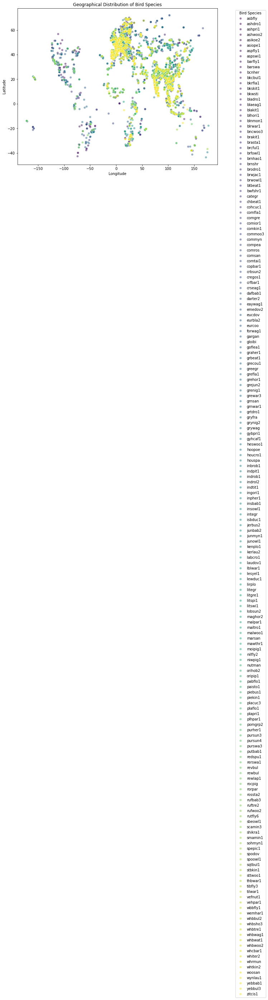

In [ ]:
# Relationship between latitude and longitude
plt.figure(figsize=(10, 8))
sns.scatterplot(x='longitude', y='latitude', data=metadata_df, hue='primary_label', palette='viridis', alpha=0.5)
plt.title('Geographical Distribution of Bird Species')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend(title='Bird Species', loc='upper right', bbox_to_anchor=(1.25, 1))
plt.show()

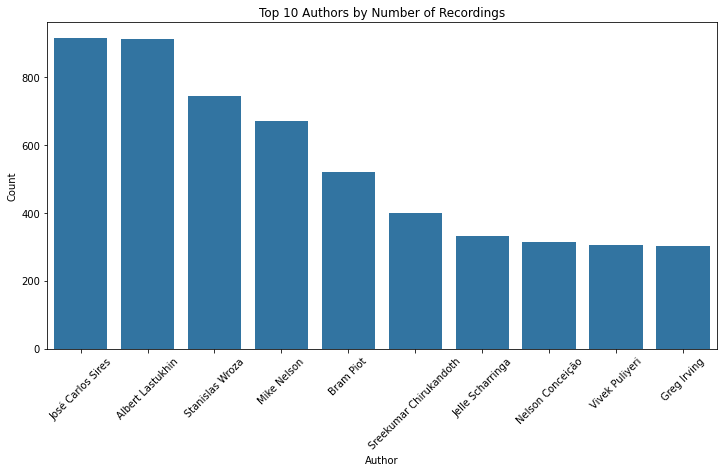

In [ ]:
# Distribution of recordings by authors
plt.figure(figsize=(12, 6))
sns.countplot(x='author', data=metadata_df, order=metadata_df['author'].value_counts().index[:10])
plt.xticks(rotation=45)
plt.title('Top 10 Authors by Number of Recordings')
plt.xlabel('Author')
plt.ylabel('Count')
plt.show()

## **Submission**
We retrain the model on the full training data and create a submission file.



In [ ]:
df_sub = pd.read_csv("/kaggle/input/birdclef-2024/sample_submission.csv")
display(df_sub)

In [ ]:
df_sub.to_csv("submission.csv", index=False)

## **🚀 The best way to BirdCLEF 2024 competition 🚀**

Dears,

I hope this message finds you well.

**1. Cast Your Vote:**

Visit the competition platform and find my EDA submission. Click on the "Vote" or "Support" button to cast your vote.

**2. Share with Your Network:**

Spread the word among your friends, family, and colleagues who may be interested in supporting my work.

1**3. Provide Feedback:**

If you have any feedback or suggestions on my EDA, please feel free to share them with me. Your input is valuable and can help me improve. I am committed to making a positive impact in the field of cancer research, and your support will bring me one step closer to achieving that goal.

Thank you for taking the time to read this message, and I genuinely appreciate your support in this competition. Together, we can contribute to the fight against ovarian cancer and advance the field of data-driven healthcare.

1If you have any questions or need more information about my EDA, please don't hesitate to reach out to me. Your support means the world to me!

